In [24]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from scipy.stats import multivariate_normal as mvn


%matplotlib inline

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)

In [25]:
df_h = pd.read_csv('raw_house_data.csv')

df_h = pd.DataFrame(df_h)
#print("df.shape:", '\n', df.shape, '\n', "-"*85)
#df.describe()



In [26]:
df_h

,MLS,sold_price,zipcode,longitude,latitude,lot_acres,taxes,year_built,bedrooms,bathrooms,sqrt_ft,garage,kitchen_features,fireplaces,floor_covering,HOA
0,21530491,5300000.00,85637,-110.378200,31.356362,2154.00,5272.00,1941,13,10,10500,0,"Dishwasher, Freezer, Refrigerator, Oven",6.0,"Mexican Tile, Wood",0
1,21529082,4200000.00,85646,-111.045371,31.594213,1707.00,10422.36,1997,2,2,7300,0,"Dishwasher, Garbage Disposal",5.0,"Natural Stone, Other",0
2,3054672,4200000.00,85646,-111.040707,31.594844,1707.00,10482.00,1997,2,3,None,None,"Dishwasher, Garbage Disposal, Refrigerator",5.0,"Natural Stone, Other: Rock",None
3,21919321,4500000.00,85646,-111.035925,31.645878,636.67,8418.58,1930,7,5,9019,4,"Dishwasher, Double Sink, Pantry: Butler, Refrigerator",4.0,"Ceramic Tile, Laminate, Wood",None
4,21306357,3411450.00,85750,-110.813768,32.285162,3.21,15393.00,1995,4,6,6396,3,"Dishwasher, Garbage Disposal, Refrigerator, Microwave, Oven",5.0,"Carpet, Concrete",55
5,21528016,3250000.00,85718,-110.910593,32.339090,1.67,27802.84,1999,3,4,6842,3,"Dishwasher, Garbage Disposal, Refrigerator, Microwave, Oven",5.0,"Natural Stone, Wood, Other",422
6,21610478,2400000.00,85712,-110.883315,32.261069,2.10,19038.42,2001,9,8,12025,4,"Dishwasher, Garbage Disposal, Oven",6.0,"Carpet, Natural Stone, Wood, Other",0
7,21211741,2500000.00,85750,-110.861002,32.331603,1.07,21646.00,2011,6,8,8921,4,"Compactor, Dishwasher, Freezer, Garbage Disposal, Refrigerator, Microwave, Oven",5.0,"Carpet, Natural Stone, Wood",220
8,21324646,3700000.00,85718,-110.912156,32.343601,6.73,25094.39,2002,5,7,5238,3,"Compactor, Dishwasher, Freezer, Garbage Disposal, Refrigerator, Microwave, Oven",1.0,"Carpet, Natural Stone, Wood, Other",421
9,21812010,3250000.00,85750,-110.837950,32.327575,3.53,18936.11,2007,5,6,6480,3,"Dishwasher, Double Sink, Electric Range, Freezer, Garbage Disposal, Island, Pantry: Butler, Refrigerator, Appliance Color: Stainless, Countertops: CORIAN, Microwave: Built In, Oven: Built In",2.0,"Carpet, Concrete",141.67


In [27]:
df_h.describe()

,MLS,sold_price,zipcode,longitude,latitude,lot_acres,taxes,year_built,bedrooms,fireplaces
count,5.000000e+03,5.000000e+03,5000.000000,5000.000000,5000.000000,4990.000000,5.000000e+03,5000.00000,5000.000000,4975.000000
mean,2.127070e+07,7.746262e+05,85723.025600,-110.912107,32.308512,4.661317,9.402828e+03,1992.32800,3.933800,1.885226
std,2.398508e+06,3.185556e+05,38.061712,0.120629,0.178028,51.685230,1.729385e+05,65.48614,1.245362,1.136578
min,3.042851e+06,1.690000e+05,85118.000000,-112.520168,31.356362,0.000000,0.000000e+00,0.00000,1.000000,0.000000
25%,2.140718e+07,5.850000e+05,85718.000000,-110.979260,32.277484,0.580000,4.803605e+03,1987.00000,3.000000,1.000000
50%,2.161469e+07,6.750000e+05,85737.000000,-110.923420,32.318517,0.990000,6.223760e+03,1999.00000,4.000000,2.000000
75%,2.180480e+07,8.350000e+05,85749.000000,-110.859078,32.394334,1.757500,8.082830e+03,2006.00000,4.000000,3.000000
max,2.192856e+07,5.300000e+06,86323.000000,-109.454637,34.927884,2154.000000,1.221508e+07,2019.00000,36.000000,9.000000


In [28]:

df_h.isnull().sum()

MLS                  0
sold_price           0
zipcode              0
longitude            0
latitude             0
lot_acres           10
taxes                0
year_built           0
bedrooms             0
bathrooms            0
sqrt_ft              0
garage               0
kitchen_features     0
fireplaces          25
floor_covering       0
HOA                  0
dtype: int64

In [29]:

data_path = "raw_house_data.csv"
missing_values = ["NaN", "None", " ", "none", "nan"]

df = pd.read_csv(data_path, na_values = missing_values )

df

,MLS,sold_price,zipcode,longitude,latitude,lot_acres,taxes,year_built,bedrooms,bathrooms,sqrt_ft,garage,kitchen_features,fireplaces,floor_covering,HOA
0,21530491,5300000.00,85637,-110.378200,31.356362,2154.00,5272.00,1941,13,10.0,10500.0,0.0,"Dishwasher, Freezer, Refrigerator, Oven",6.0,"Mexican Tile, Wood",0
1,21529082,4200000.00,85646,-111.045371,31.594213,1707.00,10422.36,1997,2,2.0,7300.0,0.0,"Dishwasher, Garbage Disposal",5.0,"Natural Stone, Other",0
2,3054672,4200000.00,85646,-111.040707,31.594844,1707.00,10482.00,1997,2,3.0,NaN,NaN,"Dishwasher, Garbage Disposal, Refrigerator",5.0,"Natural Stone, Other: Rock",NaN
3,21919321,4500000.00,85646,-111.035925,31.645878,636.67,8418.58,1930,7,5.0,9019.0,4.0,"Dishwasher, Double Sink, Pantry: Butler, Refrigerator",4.0,"Ceramic Tile, Laminate, Wood",NaN
4,21306357,3411450.00,85750,-110.813768,32.285162,3.21,15393.00,1995,4,6.0,6396.0,3.0,"Dishwasher, Garbage Disposal, Refrigerator, Microwave, Oven",5.0,"Carpet, Concrete",55
5,21528016,3250000.00,85718,-110.910593,32.339090,1.67,27802.84,1999,3,4.0,6842.0,3.0,"Dishwasher, Garbage Disposal, Refrigerator, Microwave, Oven",5.0,"Natural Stone, Wood, Other",422
6,21610478,2400000.00,85712,-110.883315,32.261069,2.10,19038.42,2001,9,8.0,12025.0,4.0,"Dishwasher, Garbage Disposal, Oven",6.0,"Carpet, Natural Stone, Wood, Other",0
7,21211741,2500000.00,85750,-110.861002,32.331603,1.07,21646.00,2011,6,8.0,8921.0,4.0,"Compactor, Dishwasher, Freezer, Garbage Disposal, Refrigerator, Microwave, Oven",5.0,"Carpet, Natural Stone, Wood",220
8,21324646,3700000.00,85718,-110.912156,32.343601,6.73,25094.39,2002,5,7.0,5238.0,3.0,"Compactor, Dishwasher, Freezer, Garbage Disposal, Refrigerator, Microwave, Oven",1.0,"Carpet, Natural Stone, Wood, Other",421
9,21812010,3250000.00,85750,-110.837950,32.327575,3.53,18936.11,2007,5,6.0,6480.0,3.0,"Dishwasher, Double Sink, Electric Range, Freezer, Garbage Disposal, Island, Pantry: Butler, Refrigerator, Appliance Color: Stainless, Countertops: CORIAN, Microwave: Built In, Oven: Built In",2.0,"Carpet, Concrete",141.67


In [30]:
df.describe()

,MLS,sold_price,zipcode,longitude,latitude,lot_acres,taxes,year_built,bedrooms,bathrooms,sqrt_ft,garage,fireplaces
count,5.000000e+03,5.000000e+03,5000.000000,5000.000000,5000.000000,4990.000000,5.000000e+03,5000.00000,5000.000000,4994.000000,4944.000000,4993.000000,4975.000000
mean,2.127070e+07,7.746262e+05,85723.025600,-110.912107,32.308512,4.661317,9.402828e+03,1992.32800,3.933800,3.829896,3716.366828,2.816143,1.885226
std,2.398508e+06,3.185556e+05,38.061712,0.120629,0.178028,51.685230,1.729385e+05,65.48614,1.245362,1.387063,1120.683515,1.192946,1.136578
min,3.042851e+06,1.690000e+05,85118.000000,-112.520168,31.356362,0.000000,0.000000e+00,0.00000,1.000000,1.000000,1100.000000,0.000000,0.000000
25%,2.140718e+07,5.850000e+05,85718.000000,-110.979260,32.277484,0.580000,4.803605e+03,1987.00000,3.000000,3.000000,3047.000000,2.000000,1.000000
50%,2.161469e+07,6.750000e+05,85737.000000,-110.923420,32.318517,0.990000,6.223760e+03,1999.00000,4.000000,4.000000,3512.000000,3.000000,2.000000
75%,2.180480e+07,8.350000e+05,85749.000000,-110.859078,32.394334,1.757500,8.082830e+03,2006.00000,4.000000,4.000000,4130.250000,3.000000,3.000000
max,2.192856e+07,5.300000e+06,86323.000000,-109.454637,34.927884,2154.000000,1.221508e+07,2019.00000,36.000000,36.000000,22408.000000,30.000000,9.000000


In [31]:
df.isnull().sum()

MLS                   0
sold_price            0
zipcode               0
longitude             0
latitude              0
lot_acres            10
taxes                 0
year_built            0
bedrooms              0
bathrooms             6
sqrt_ft              56
garage                7
kitchen_features     33
fireplaces           25
floor_covering        1
HOA                 562
dtype: int64

In [32]:
df_clean = df

df_clean["garage"] =  df_clean["garage"].fillna(0)
df_clean["fireplaces"] = df_clean["fireplaces"].fillna(0)

df_clean["HOA"] = df_clean["HOA"].fillna(0)
df_clean["HOA"] = df_clean["HOA"].replace(',','', regex = True) #remover commas from HOA 

df_clean['HOA'] = df_clean["HOA"].astype(float)

# int 

In [33]:
df_clean.describe()

,MLS,sold_price,zipcode,longitude,latitude,lot_acres,taxes,year_built,bedrooms,bathrooms,sqrt_ft,garage,fireplaces,HOA
count,5.000000e+03,5.000000e+03,5000.000000,5000.000000,5000.000000,4990.000000,5.000000e+03,5000.00000,5000.000000,4994.000000,4944.000000,5000.000000,5000.000000,5000.000000
mean,2.127070e+07,7.746262e+05,85723.025600,-110.912107,32.308512,4.661317,9.402828e+03,1992.32800,3.933800,3.829896,3716.366828,2.812200,1.875800,91.461018
std,2.398508e+06,3.185556e+05,38.061712,0.120629,0.178028,51.685230,1.729385e+05,65.48614,1.245362,1.387063,1120.683515,1.196753,1.141506,516.737130
min,3.042851e+06,1.690000e+05,85118.000000,-112.520168,31.356362,0.000000,0.000000e+00,0.00000,1.000000,1.000000,1100.000000,0.000000,0.000000,0.000000
25%,2.140718e+07,5.850000e+05,85718.000000,-110.979260,32.277484,0.580000,4.803605e+03,1987.00000,3.000000,3.000000,3047.000000,2.000000,1.000000,0.000000
50%,2.161469e+07,6.750000e+05,85737.000000,-110.923420,32.318517,0.990000,6.223760e+03,1999.00000,4.000000,4.000000,3512.000000,3.000000,2.000000,45.000000
75%,2.180480e+07,8.350000e+05,85749.000000,-110.859078,32.394334,1.757500,8.082830e+03,2006.00000,4.000000,4.000000,4130.250000,3.000000,3.000000,123.000000
max,2.192856e+07,5.300000e+06,86323.000000,-109.454637,34.927884,2154.000000,1.221508e+07,2019.00000,36.000000,36.000000,22408.000000,30.000000,9.000000,20000.000000


In [34]:
df_clean.isnull().sum()

MLS                  0
sold_price           0
zipcode              0
longitude            0
latitude             0
lot_acres           10
taxes                0
year_built           0
bedrooms             0
bathrooms            6
sqrt_ft             56
garage               0
kitchen_features    33
fireplaces           0
floor_covering       1
HOA                  0
dtype: int64

In [35]:
df_clean['lot_acres'].isnull().values.any()

True

In [36]:

df_clean['lot_acres'].isnull().values.sum()

10

In [37]:

df_clean.isnull().values.any()

True

In [38]:
df_clean.isnull().sum().sum()

106

In [45]:

df1 = df_clean[df_clean.isna().any(axis=1)]

In [41]:

df1.sum()

MLS           8.571061e+08
sold_price    6.092954e+07
zipcode       7.538019e+06
longitude    -9.766798e+03
latitude      2.810894e+03
lot_acres     2.418870e+03
taxes         5.825856e+05
year_built    1.757610e+05
bedrooms      3.680000e+02
bathrooms     3.690000e+02
sqrt_ft       1.538150e+05
garage        2.385000e+02
fireplaces    1.440000e+02
HOA           1.084080e+04
dtype: float64

In [42]:
df1.isnull().sum()

MLS                  0
sold_price           0
zipcode              0
longitude            0
latitude             0
lot_acres           10
taxes                0
year_built           0
bedrooms             0
bathrooms            6
sqrt_ft             56
garage               0
kitchen_features    33
fireplaces           0
floor_covering       1
HOA                  0
dtype: int64

In [40]:
df1

,MLS,sold_price,zipcode,longitude,latitude,lot_acres,taxes,year_built,bedrooms,bathrooms,sqrt_ft,garage,kitchen_features,fireplaces,floor_covering,HOA
2,3054672,4200000.0,85646,-111.040707,31.594844,1707.00,10482.00,1997,2,3.0,NaN,0.0,"Dishwasher, Garbage Disposal, Refrigerator",5.0,"Natural Stone, Other: Rock",0.00
141,21815257,169000.0,85648,-110.918513,31.451945,0.52,80.83,2018,4,3.0,1700.0,2.0,NaN,0.0,Ceramic Tile,0.00
259,21514843,1200000.0,85646,-111.040290,31.594518,91.70,8473.86,1925,6,5.0,6884.0,0.0,NaN,7.0,"Carpet, Concrete",0.00
385,21119508,1000000.0,85742,-111.031723,32.440190,4.13,3861.65,2009,6,6.0,6520.0,4.0,NaN,3.0,Other,50.00
437,21402489,900000.0,85718,-110.876201,32.333403,1.35,11066.00,2013,5,5.0,5299.0,3.0,NaN,3.0,Other,145.00
490,3055989,950000.0,85646,-111.073405,31.619537,4.40,13193.80,2008,3,7.0,NaN,4.0,"Compactor, Dishwasher, Double Sink, Pantry: Butler, Refrigerator, Countertops: GRANITE, Microwave",3.0,"Mexican Tile, Wood, Other",0.00
629,21318982,900000.0,85745,-111.113182,32.242099,7.74,18509.30,2013,5,6.0,9284.0,3.0,NaN,4.0,"Ceramic Tile, Wood, Other",250.00
643,21409408,1010000.0,85718,-110.918577,32.300914,1.48,16796.89,2005,5,7.0,7284.0,4.0,NaN,2.0,"Carpet, Concrete, Other",150.00
644,21208845,1050000.0,85755,-110.993794,32.457189,0.90,15729.91,2008,4,6.0,5056.0,3.0,NaN,2.0,"Carpet, Natural Stone",153.00
937,21709470,920000.0,85750,-110.858539,32.321176,0.76,12869.23,1999,7,5.0,6192.0,3.0,NaN,1.0,"Carpet, Ceramic Tile",516.00


In [44]:


df2 = df_clean[df_clean.isnull().any(axis=1)]

In [49]:
print(df2.shape)
df1.shape

(88, 16)


(88, 16)

In [50]:
df_clean.isnull().sum()

MLS                  0
sold_price           0
zipcode              0
longitude            0
latitude             0
lot_acres           10
taxes                0
year_built           0
bedrooms             0
bathrooms            6
sqrt_ft             56
garage               0
kitchen_features    33
fireplaces           0
floor_covering       1
HOA                  0
dtype: int64

In [51]:
df['sqrt_ft'].describe()

count     4944.000000
mean      3716.366828
std       1120.683515
min       1100.000000
25%       3047.000000
50%       3512.000000
75%       4130.250000
max      22408.000000
Name: sqrt_ft, dtype: float64

In [52]:
df_clean['sqrt_ft'].describe()

count     4944.000000
mean      3716.366828
std       1120.683515
min       1100.000000
25%       3047.000000
50%       3512.000000
75%       4130.250000
max      22408.000000
Name: sqrt_ft, dtype: float64

In [54]:
df_clean['sqrt_ft'] = df_clean['sqrt_ft'].fillna(df_clean['sqrt_ft'].median())

In [55]:
df_clean.isnull().sum()

MLS                  0
sold_price           0
zipcode              0
longitude            0
latitude             0
lot_acres           10
taxes                0
year_built           0
bedrooms             0
bathrooms            6
sqrt_ft              0
garage               0
kitchen_features    33
fireplaces           0
floor_covering       1
HOA                  0
dtype: int64

In [53]:
df_clean['sqrt_ft'].median()

3512.0

In [56]:

df_clean['kitchen_features'] = df_clean['kitchen_features'].fillna('None')

In [57]:
df_clean.isnull().sum()

MLS                  0
sold_price           0
zipcode              0
longitude            0
latitude             0
lot_acres           10
taxes                0
year_built           0
bedrooms             0
bathrooms            6
sqrt_ft              0
garage               0
kitchen_features     0
fireplaces           0
floor_covering       1
HOA                  0
dtype: int64

In [58]:

df3 = df_clean[df_clean.isna().any(axis=1)]
df3

,MLS,sold_price,zipcode,longitude,latitude,lot_acres,taxes,year_built,bedrooms,bathrooms,sqrt_ft,garage,kitchen_features,fireplaces,floor_covering,HOA
967,3058213,695000.0,85645,-111.183593,31.702330,NaN,2480.58,1932,4,4.0,3512.0,2.0,"Dishwasher, Double Sink, Gas Range, Refrigerator, Oven",0.0,Ceramic Tile,0.00
1659,3055188,700000.0,85646,-111.046366,31.623839,NaN,6740.66,2007,3,4.0,3512.0,3.0,"Dishwasher, Double Sink, Freezer, Garbage Disposal, Gas Range, Lazy Susan, Refrigerator, Appliance Color: Stainless, Countertops: Granite, Microwave, Oven",0.0,Natural Stone,157.00
2025,3044867,660000.0,85614,-110.969465,31.836723,3.60,5526.00,2007,3,NaN,3512.0,3.0,"Desk, Dishwasher, Garbage Disposal, Gas Range, Island, Lazy Susan, Pantry: Closet, Refrigerator, Water Purifier, Microwave, Oven",0.0,"Carpet, Other: Tile-Other",1000.00
2564,3051223,680000.0,85622,-111.000925,31.836922,NaN,4158.40,2007,3,4.0,3512.0,3.0,"Dishwasher, Double Sink, Garbage Disposal, Gas Range, Island, Lazy Susan, Pantry: Closet, Refrigerator, Reverse Osmosis, Wet Bar, Appliance Color: Stainless, Countertops: Granite, Microwave: Stainless steel, Oven: Stainless steel",1.0,"Carpet, Ceramic Tile",100.00
2766,3042851,575000.0,85614,-110.960497,31.854446,0.87,4623.05,2002,3,NaN,3512.0,3.0,"Dishwasher, Garbage Disposal, Gas Range, Island, Lazy Susan, Pantry: Butler, Refrigerator, Water Purifier, Microwave, Oven",0.0,"Carpet, Other",250.00
2939,3060029,655000.0,85614,-110.971212,31.835117,NaN,6433.00,2001,3,4.0,3512.0,3.0,"Dishwasher, Double Sink, Electric Range, Garbage Disposal, Pantry: Closet, Refrigerator, Appliance Color: Black, Countertops: Granite, Microwave, Oven",0.0,"Carpet, Ceramic Tile",83.33
3108,3047540,610000.0,85614,-111.002544,31.840061,1.70,3800.00,2007,3,NaN,3512.0,3.0,None,0.0,NaN,1200.00
3420,3059875,605000.0,85622,-111.009941,31.839620,NaN,6134.56,2012,4,4.0,3512.0,2.0,"Compactor, Dishwasher, Double Sink, Garbage Disposal, Island, Pantry: Closet, Refrigerator, Wet Bar, Appliance Color: Stainless, Countertops: Granite, Microwave, Oven",0.0,"Carpet, Ceramic Tile",85.00
3529,3046317,535000.0,85614,-110.986426,31.806614,4.27,3826.25,2006,2,NaN,3512.0,3.0,"Dishwasher, Garbage Disposal, Gas Range, Island, Pantry: Butler, Refrigerator, Water Purifier",0.0,"Carpet, Other: Tile-Other",0.00
3530,3050480,580000.0,85622,-111.007069,31.846199,NaN,4498.01,1987,3,3.0,3512.0,5.0,"Dishwasher, Double Sink, Electric Range, Garbage Disposal, Island, Pantry: Cabinet, Refrigerator, Water Purifier, Wet Bar, Countertops: Tile, Microwave, Oven",1.0,"Carpet, Mexican Tile",0.00


In [60]:
df_clean['lot_acres'].describe()


count    4990.000000
mean        4.661317
std        51.685230
min         0.000000
25%         0.580000
50%         0.990000
75%         1.757500
max      2154.000000
Name: lot_acres, dtype: float64

In [ ]:
df_clean['lot_acres'].describe()


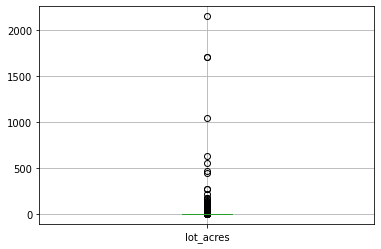

In [62]:

df_clean.boxplot(column=['lot_acres'])


In [63]:
df_clean['lot_acres'] = df_clean['lot_acres'].fillna(df_clean['lot_acres'].median())

In [64]:
df_clean.isnull().sum()

MLS                 0
sold_price          0
zipcode             0
longitude           0
latitude            0
lot_acres           0
taxes               0
year_built          0
bedrooms            0
bathrooms           6
sqrt_ft             0
garage              0
kitchen_features    0
fireplaces          0
floor_covering      1
HOA                 0
dtype: int64

In [65]:

df4 = df_clean[df_clean.isna().any(axis=1)]
df4

,MLS,sold_price,zipcode,longitude,latitude,lot_acres,taxes,year_built,bedrooms,bathrooms,sqrt_ft,garage,kitchen_features,fireplaces,floor_covering,HOA
2025,3044867,660000.0,85614,-110.969465,31.836723,3.60,5526.00,2007,3,NaN,3512.0,3.0,"Desk, Dishwasher, Garbage Disposal, Gas Range, Island, Lazy Susan, Pantry: Closet, Refrigerator, Water Purifier, Microwave, Oven",0.0,"Carpet, Other: Tile-Other",1000.0
2766,3042851,575000.0,85614,-110.960497,31.854446,0.87,4623.05,2002,3,NaN,3512.0,3.0,"Dishwasher, Garbage Disposal, Gas Range, Island, Lazy Susan, Pantry: Butler, Refrigerator, Water Purifier, Microwave, Oven",0.0,"Carpet, Other",250.0
3108,3047540,610000.0,85614,-111.002544,31.840061,1.70,3800.00,2007,3,NaN,3512.0,3.0,None,0.0,NaN,1200.0
3529,3046317,535000.0,85614,-110.986426,31.806614,4.27,3826.25,2006,2,NaN,3512.0,3.0,"Dishwasher, Garbage Disposal, Gas Range, Island, Pantry: Butler, Refrigerator, Water Purifier",0.0,"Carpet, Other: Tile-Other",0.0
3822,3045347,550000.0,85614,-111.008754,31.841141,0.99,3702.07,2007,2,NaN,3512.0,3.0,"Dishwasher, Garbage Disposal, Island, Lazy Susan, Pantry: Closet, Microwave",0.0,"Carpet, Other: Tile-Other",1200.0
4812,3046287,500000.0,85646,-111.051431,31.636207,1.03,8102.00,1999,4,NaN,3512.0,2.0,"Dishwasher, Electric Range, Garbage Disposal, Pantry: Butler, Refrigerator, Microwave, Oven",0.0,"Carpet, Mexican Tile",250.0


In [66]:
df_clean.isnull().sum()

MLS                 0
sold_price          0
zipcode             0
longitude           0
latitude            0
lot_acres           0
taxes               0
year_built          0
bedrooms            0
bathrooms           6
sqrt_ft             0
garage              0
kitchen_features    0
fireplaces          0
floor_covering      1
HOA                 0
dtype: int64

In [67]:

df_clean['bathrooms'] = df_clean['bathrooms'].fillna('None')

In [68]:
df_clean['floor_covering'] = df_clean['floor_covering'].fillna('None')

In [71]:
cleaned_df_csv = df_clean.to_csv('/cleaned_house_data.csv', index = False)